## Introduction

SegFormer is a simple architecture with some key innovations that allow it to acheive state of the art performance at much higher speeds and fewer parameters than other competing methods. In this assignment, you will be implementing the building blocks of SegFormer. An overview of the architecture is provided below.

It is highly encouraged for you to review the SegFormer paper, available [here](https://arxiv.org/pdf/2105.15203.pdf). In particular, Section 3 contains detailed descriptions of the modules you will be implementing.

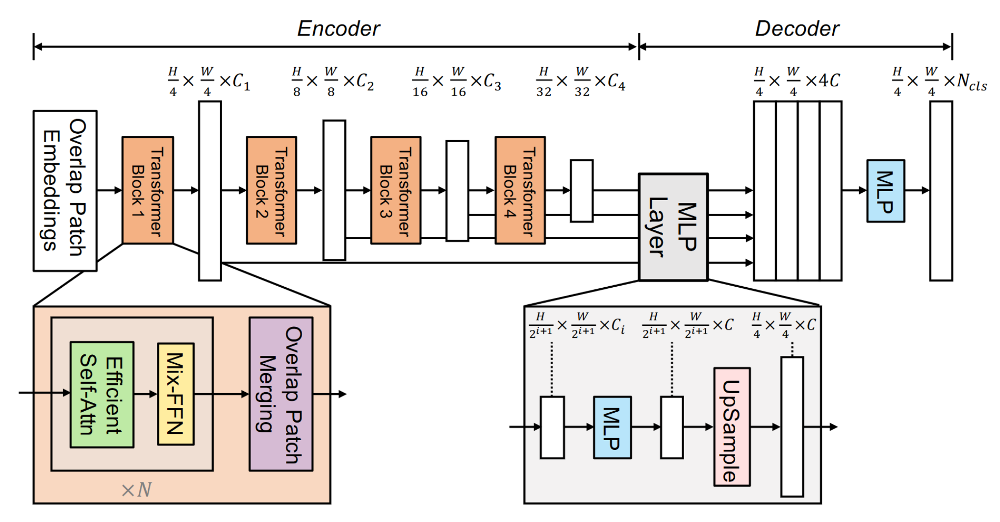

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/CIS 680/SegFormer

/content/drive/.shortcut-targets-by-id/1Pi5eJ0d6oqZkV8_nSQYelS2uCrVWC9ph/CIS 680/SegFormer


In [ ]:
%%capture
!pip install pytorch-lightning torchbench

import torch
from torch import nn
import numpy as np
import pytorch_lightning as pl
from torchbench.datasets import ADE20K
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_tensor, pil_to_tensor, resize, normalize
from torchvision.transforms import InterpolationMode
from torch.utils.data import Subset, DataLoader
from tqdm import tqdm

## Data
For this assignment, we will use a simplified subset of ADE20K containg approximately 11,000 images with only four classes: "plant", "person/animal", "vehicle", and "background". The data in composed of a semantic class for each pixel - there is no distinction between different instances of the same object, unlike in previous assignments.

The following code downloads the original dataset, processes it, and visualizes an example.

In [ ]:
def simple_ade20k_transforms(image, target):
    image = resize(to_tensor(image), (256, 256), antialias=True)
    image = normalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    target = resize(pil_to_tensor(target), (64, 64), InterpolationMode.NEAREST)[0].long()
    # 0: background, -1: plant, -2: person/animal, -3: vehicle
    class_mapping = [(5, -1), (10, -1), (13, -2), (18, -1), (21, -3), (67, -1),
                     (77, -3), (84, -3), (91, -3), (103, -3), (104, -3), (127, -2), (128, -3)]
    for cm in class_mapping:
        target[target == cm[0]] = cm[1]
    target[target > 0] = 0
    target *= -1
    return image, target

In [ ]:
%%capture
! mkdir -p /content/data/ADEChallengeData2016/images/training
! mkdir -p /content/data/ADEChallengeData2016/images/validation
# train_dataset = ADE20K('/content/data', 'train', download=True, transforms=simple_ade20k_transforms)
val_dataset = ADE20K('/content/data', 'val', download=True, transforms=simple_ade20k_transforms)

In [ ]:
%%capture
def trim_dataset(dataset):
    valid_indices = []
    for entry in tqdm(range(len(dataset))):
        _, target = dataset[entry]
        if (target > 0).float().mean() > 0.01:
            valid_indices.append(entry)
    if len(dataset) > len(valid_indices):
        dataset = Subset(dataset, valid_indices)
    return dataset

# train_dataset = trim_dataset(train_dataset)
val_dataset = trim_dataset(val_dataset)

In [ ]:
idx = 2453
plt.imshow(train_dataset[idx][0].permute(1, 2, 0) / 4 + 0.5) # just for visualization
plt.axis('off')
plt.show()
plt.imshow(train_dataset[idx][1], vmin=0, vmax=3, cmap='inferno')
plt.axis('off')
plt.show()

## Modules
For this section, you will have to implement the base functionalities and modules for the SegFormer. As illustrated in the **Figure 2** and **Section 3** in the paper, we divide SegFormer into encoder-decoder sections. The encoder mainly consists of multiple layers of MixTransformerEncoderLayer, which then consists of OverlapPatchMergiing + (EfficientSelfAttention + MixFFN). While patch merging is relatively intuitive, you have to implement EfficientSelfAttention following **Equation 1** in the paper, and MixFFN as illustrated in **Equation 3**. On the other hand, the decoder section also consists of multiple decoder blocks, ending with a MLP. Refer to **Equation 4** for this part.

In [ ]:
# Combine adjacent patches to reduce feature map size, followed by LayerNorm
# Hint, patch merging can be accomplished with a single Conv2D module
class OverlapPatchMerging(nn.Module):
    def __init__(self, in_channels, out_channels, patch_size, stride, padding):
        super().__init__()

        self.convolutional_layer = nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=patch_size,
            stride=stride,
            padding=padding
            )

        self.layerNorm = nn.LayerNorm(out_channels)

    def forward(self, patches):
        """Merge patches to reduce dimensions of input.

        :param patches: tensor with shape (B, C, H, W) where
            B is the Batch size
            C is the number of Channels
            H and W are the Height and Width
        :return: tensor with shape (B, C, H, W)
        """
        # Apply the convolutional layer to input patches
        x = self.convolutional_layer(patches)

        _, _, height, width = x.shape

        x = self.layerNorm(x.flatten(2).transpose(1,2))

        return x, height, width

In [ ]:
# Perform attention with a reduced set of keys
# Hint, use a Linear layer followed by a LayerNorm before passing into MultiheadAttention
class EfficientSelfAttention(nn.Module):
    def __init__(self, channels, reduction_ratio, num_heads):
        super().__init__()
        assert channels % num_heads == 0, f"channels {channels} should be divided by num_heads {num_heads}."

        self.heads= num_heads

        # Attention
        self.key_value_extractor = nn.Linear(channels, channels * 2)
        self.query_projection = nn.Linear(channels, channels)
        self.softmax = nn.Softmax(dim=-1)
        self.final_projection = nn.Linear(channels, channels)

        # Reduction
        self.spatial_reduction = nn.Conv2d(
            in_channels=channels,
            out_channels=channels,
            kernel_size=reduction_ratio,
            stride=reduction_ratio
            )
        self.layer_norm_reduction = nn.LayerNorm(channels)

    def forward(self, x, H, W):

        """ Perform self attention with reduced sequence length

        :param x: tensor of shape (B, N, C) where
            B is the batch size,
            N is the number of queries (equal to H * W)
            C is the number of channels
        :return: tensor of shape (B, N, C)
        """
        B,N,C = x.shape
        channels_per_head = int(C / self.heads)

        # Spatial Reduction
        x_reduced = self.layer_norm_reduction(
            self.spatial_reduction(x.permute(0, 2, 1).view(B, C, H, W))
                .view(B, C, -1)
                .permute(0, 2, 1)
        )

        # Attention
        # Key-Value Extraction
        key_value = self.key_value_extractor(x_reduced)

        # Reshape key_value for attention computation
        reshaped_key_value = key_value.reshape(B, -1, 2, self.heads, channels_per_head)

        # Permute dimensions for correct arrangement before further processing
        permuted_key_value = reshaped_key_value.permute(2, 0, 3, 1, 4)

        keys, values = permuted_key_value[0], permuted_key_value[1]


        # Obtain queries by projecting the input x
        queries = self.query_projection(x)
        reshaped_queries = queries.reshape(B, N, self.heads, channels_per_head)
        permiuted_queries = reshaped_queries.permute(0, 2, 1, 3)

        # Calculate attention scores using scaled dot-product attention
        attention_scores = self.softmax(permiuted_queries @ keys.transpose(-2, -1) / (channels_per_head ** 0.5))

        weighted_values = (attention_scores @ values).transpose(1, 2)

        # Reshape the result to the original shape
        attention = weighted_values.reshape(B, N, C)

        x = self.final_projection(attention)
        return x

In [ ]:
# A feedforward network that mixes spatial information
# Should implement the following structure (inverse bottleneck):
#     mlp (channels -> expanded_channels)
#     depth-wise convolution (3 x 3)
#     activation function (gelu)
#     mlp (expanded_channels -> channels)
class MixFFN(nn.Module):
    def __init__(self, channels, expansion_factor):
        super().__init__()

        self.expansion_mlp = nn.Linear(
            in_features=channels,
            out_features=channels*expansion_factor
            )

        self.depthwise_conv = nn.Conv2d(
            in_channels=channels*expansion_factor,
            out_channels=channels*expansion_factor,
            kernel_size=3,
            padding='same',
            groups=channels
        )

        self.gelu = nn.GELU()

        self.prediction_mlp = nn.Linear(
            in_features=channels*expansion_factor,
            out_features=channels
            )


    def forward(self, x, H, W):
        """ Perform self attention with reduced sequence length

        :param x: tensor with shape (B, C, H, W) where
            B is the Batch size
            C is the number of Channels
            H and W are the Height and Width
        :return: tensor with shape (B, C, H, W)
        """

        expanded_features = self.expansion_mlp(x)
        batch_size, num_queries, expanded_channels = expanded_features.shape

        reshaped_features = expanded_features.transpose(1, 2).view(batch_size, expanded_channels, H, W)

        depthwise_conv_output = self.depthwise_conv(reshaped_features)

        flattened_depthwise = depthwise_conv_output.flatten(2)

        flattened_depthwise_transposed = flattened_depthwise.transpose(1, 2)

        depthwise_conv_output = self.gelu(flattened_depthwise_transposed)

        output_features = self.prediction_mlp(depthwise_conv_output)

        return output_features

In [ ]:
# Combine patch merging with n_layers of [attention followed by ffn]
class MixTransformerEncoderLayer(nn.Module):
    def __init__(self, in_channels, out_channels, patch_size, stride, padding,
                 n_layers, reduction_ratio, num_heads, expansion_factor):
        super().__init__()

        # OverlapPatchMerging
        self.patch_merge = OverlapPatchMerging(in_channels, out_channels, patch_size, stride, padding)

        # EfficientSelfAttention modules
        self.attention_modules = nn.ModuleList(
            [EfficientSelfAttention(
                out_channels,
                reduction_ratio,
                num_heads
                ) for _ in range(n_layers)]
            )

        # MixFFN modules
        self.ffn_modules = nn.ModuleList(
            [MixFFN(
                out_channels,
                expansion_factor
                ) for _ in range(n_layers)]
            )

        # LayerNorm modules
        self.layer_norms = nn.ModuleList(
            [nn.LayerNorm(
                out_channels
                ) for _ in range(n_layers)]
            )

    def _create_modules(self, module_class, n, *args, **kwargs):
        """
        Helper function to create a ModuleList of a specific module class.

        Args:
        - module_class (type): Type of the module class to instantiate.
        - n (int): Number of modules to create.

        Returns:
        - nn.ModuleList: List of module instances.
        """
        return nn.ModuleList([module_class(*args, **kwargs) for _ in range(n)])

    def forward(self, x):
        """ Run one block of the mix vision transformer

        :param x: tensor with shape (B, C, H, W) where
            B is the Batch size
            C is the number of Channels
            H and W are the Height and Width
        :return: tensor with shape (B, C, H, W)
        """

        batch_size, channels, height, width = x.shape
        x, new_height, new_width = self.patch_merge(x)

        # Process input tensor through attention, feedforward, and normalization layers
        for attn, ffn, layer_norm in zip(self.attention_modules, self.ffn_modules, self.layer_norms):
            x = x + attn.forward(x, new_height, new_width)
            x = x + ffn.forward(x, new_height, new_width)
            x = layer_norm.forward(x)

        x = x.reshape(batch_size, new_height, new_width, -1).permute(0, 3, 1, 2)
        return x

In [ ]:
# Merge multiple feature maps and produce predictions
# Should implement the following structure
#     mlp_i (in_channels -> embed_channels)
#     usample and concatenate
#     mlp (m * embed_channels -> embed_channels)
#     batch norm and relu
#     mlp (embed_channels -> num_classes)
from torch.nn.functional import interpolate
class MLPDecoder(nn.Module):
    def __init__(self, in_channels, embed_channels, out_dims, num_classes):
        """Initialize MLP Decoder.
        :param in_channels: list of int, number of input channels for each layeer
        :param embed_channels: int, common embedding channels
        :param out_dims: tuple, dimensions of common feature map
        """
        super().__init__()

        # MLP_i layers
        self.mlp_i_layers = nn.ModuleList(
            [nn.Conv2d(
                in_channels = in_channels[i],
                out_channels = embed_channels,
                kernel_size=1) for i in range(len(in_channels))
                ]
            )

        # Final convolution layer for concatenation
        self.concatenation_conv = nn.Conv2d(
            in_channels=len(in_channels) * embed_channels,
            out_channels=embed_channels,
            kernel_size=1,
            bias=False
            )

        # BatchNorm and ReLU layers
        self.batch_norm = nn.BatchNorm2d(embed_channels)
        self.relu = nn.ReLU(inplace=True)

        # Final MLP layer for predictions
        self.mlp_predictions = nn.Conv2d(
            in_channels=embed_channels,
            out_channels=num_classes,
            kernel_size=1
            )

        # Dimensions of the common feature map
        self.out_dims = out_dims

    def _create_modules(self, module_class, n, *args, **kwargs):
        """
        Helper function to create a ModuleList of a specific module class.

        Args:
        - module_class (type): Type of the module class to instantiate.
        - n (int): Number of modules to create.
        - *args: Additional positional arguments for module instantiation.
        - **kwargs: Additional keyword arguments for module instantiation.

        Returns:
        - nn.ModuleList: List of module instances.
        """
        return nn.ModuleList([module_class(*args, **kwargs) for _ in range(n)])


    def forward(self, x):
        """ Take feature map to common shape
        :param x: list of tensors with shape (B, Ci, Hi, Wi)
            B is the Batch size
            Ci is the number of input Channels
            Hi and Wi are the input Height and Width
        :return: tensor with shape (B, C, H, W)
            B is the Batch size
            C is the number of output Channels
            H and W are the input Height and Width
        """

        for i in range(len(x)):
            x[i] = self.mlp_i_layers[i].forward(x[i])
            x[i] = interpolate(
                x[i],
                size=self.out_dims,
                mode='bilinear'
                )

        # Concatenate the feature maps along the channel dimension
        concatenated_feature_maps = torch.cat(x, dim=1)

        batch_norm_output = self.batch_norm(self.concatenation_conv(concatenated_feature_maps))
        final_concatenation_output = self.relu(batch_norm_output)

        # Pass the final concatenated feature maps through the MLP for predictions
        final_predictions = self.mlp_predictions(final_concatenation_output)

        return final_predictions

## Model and Training
We have provided you with a near-complete network template which you can indicate how a complete SegFormer is structured and how it calls the modules we have built. For validation step, you need to implement mean IoU as paper suggests.

In [ ]:
# This is implemented for you! Just implement the miou
class SegFormer_B0(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.encoder_blocks = nn.ModuleList([
            MixTransformerEncoderLayer(3, 32, patch_size=7, stride=4, padding=3, n_layers=2, reduction_ratio=8, num_heads=1, expansion_factor=8),
            MixTransformerEncoderLayer(32, 64, patch_size=3, stride=2, padding=1, n_layers=2, reduction_ratio=4, num_heads=2, expansion_factor=8),
            MixTransformerEncoderLayer(64, 160, patch_size=3, stride=2, padding=1, n_layers=2, reduction_ratio=2, num_heads=5, expansion_factor=4),
            MixTransformerEncoderLayer(160, 256, patch_size=3, stride=2, padding=1, n_layers=2, reduction_ratio=1, num_heads=8, expansion_factor=4)
        ])
        self.decoder = MLPDecoder([32, 64, 160, 256], 256, (64, 64), 4)
        self.loss = nn.CrossEntropyLoss()

        #@NOTE: Ensure that appends are of cpu vars!
        self._lossLogs = []
        self._miouLogs = []
        self.losslogsPerBatch = 0
        self.mioulogsPerBatch = 0
        self.trainCounter = 0
        self.valCounter = 0

    def forward(self, images):
        embeds = [images]
        for block in self.encoder_blocks:
            embeds.append(block(embeds[-1]))
        return self.decoder(embeds[1:])

    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=1e-5) #6e-5
        return optimizer

    def miou(self, prediction, targets):
        num_classes = prediction.size()[1]
        valid_classes_count = prediction.size()[1]

        # Convert the prediction to the same format as the target (B H W)
        predicted_labels = prediction.argmax(dim=1)  # Across the channels, get the label with the highest probability

        intersection_over_union = 0

        for class_index in range(num_classes):
            # Create boolean masks for the target and predicted labels corresponding to the current class
            target_mask = targets == class_index
            predicted_mask = predicted_labels == class_index

            # Check if the target mask has no instances of the current class
            if target_mask.sum() == 0:
                valid_classes_count -= 1
                continue

            intersection = torch.logical_and(
                predicted_mask,
                target_mask
                ).sum().item()
            union = torch.logical_or(
                predicted_mask,
                target_mask
                ).sum().item()

            intersection_over_union += intersection / (union + 1e-6)  # Stable division using a small threshold

        mean_iou = intersection_over_union / valid_classes_count

        return mean_iou


    def on_epoch_start(self):
        self.current_epoch += 1

    def training_step(self, batch, batch_idx):
        images, targets = batch
        predictions = self.forward(images)
        loss = self.loss(predictions, targets)
        self.log('train_loss', loss, sync_dist=True, prog_bar=True)

        #Logs added
        self.losslogsPerBatch += loss.detach().cpu()
        self.trainCounter+=1

        return loss

    def validation_step(self, batch, batch_idx):
        images, targets = batch
        predictions = self.forward(images)
        miou = self.miou(predictions, targets)
        self.log('miou', miou, sync_dist=True, prog_bar=True)

        #Logs added
        self.mioulogsPerBatch += miou
        self.valCounter+=1

    def on_train_epoch_end(self):
        self._lossLogs.append(self.losslogsPerBatch/self.trainCounter)
        print(f'Epoch {self.current_epoch}: Training Loss: {self.losslogsPerBatch/self.trainCounter}')

        self.trainCounter = 0;
        self.losslogsPerBatch = 0;

        torch.save(self._lossLogs, 'loss_epochwise.pt')

    def on_validation_epoch_end(self):
        self._miouLogs.append(self.mioulogsPerBatch/self.valCounter)
        print(f'Epoch {self.current_epoch}: Validation Mean IoU: {self.mioulogsPerBatch/self.valCounter}')

        self.valCounter = 0;
        self.mioulogsPerBatch = 0;

        torch.save(self._miouLogs, 'miou_epochwise.pt')

In [ ]:
if torch.cuda.is_available():
    num_devices = torch.cuda.device_count()
    print(f"Number of available GPU devices: {num_devices}")
else:
    num_devices = 1
    print("No GPU available, using 1 CPU.")

Number of available GPU devices: 1


In [ ]:
model = SegFormer_B0()
train_loader = DataLoader(train_dataset, batch_size=16, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=16, num_workers=2)

from pytorch_lightning.callbacks import ModelCheckpoint
checkpoint_callback = ModelCheckpoint(
    monitor='miou',
    filename='segformer_b0-{epoch:02d}-{miou:.4f}',
    save_top_k=45,
    mode='max',
)

trainer = pl.Trainer(devices=num_devices, accelerator="gpu", max_epochs=45, callbacks=[checkpoint_callback])
trainer.fit(model, train_loader,val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type             | Params
----------------------------------------------------
0 | encoder_blocks | ModuleList       | 3.7 M 
1 | decoder        | MLPDecoder       | 395 K 
2 | loss           | CrossEntropyLoss | 0     
----------------------------------------------------
4.1 M     Trainable params
0         Non-trainable params
4.1 M     Total params
16.487    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Epoch 0: Validation Mean IoU: 0.10262430971112665


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 0: Validation Mean IoU: 0.2969286195676068
Epoch 0: Training Loss: 0.831047534942627


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1: Validation Mean IoU: 0.2995326205296589
Epoch 1: Training Loss: 0.5757455825805664


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2: Validation Mean IoU: 0.30724554911204793
Epoch 2: Training Loss: 0.5029077529907227


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3: Validation Mean IoU: 0.3126448178406479
Epoch 3: Training Loss: 0.471408873796463


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4: Validation Mean IoU: 0.3170154394669031
Epoch 4: Training Loss: 0.4522935152053833


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5: Validation Mean IoU: 0.32120784536014424
Epoch 5: Training Loss: 0.4383642077445984


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6: Validation Mean IoU: 0.3259973546994993
Epoch 6: Training Loss: 0.427276074886322


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7: Validation Mean IoU: 0.33150284313105854
Epoch 7: Training Loss: 0.4178107678890228


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8: Validation Mean IoU: 0.33827785587272424
Epoch 8: Training Loss: 0.4093480110168457


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9: Validation Mean IoU: 0.34498124486881954
Epoch 9: Training Loss: 0.4016077518463135


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10: Validation Mean IoU: 0.3522113681892797
Epoch 10: Training Loss: 0.39449822902679443


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11: Validation Mean IoU: 0.3599293641395197
Epoch 11: Training Loss: 0.38791489601135254


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12: Validation Mean IoU: 0.3681403181612493
Epoch 12: Training Loss: 0.3816985785961151


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13: Validation Mean IoU: 0.37551379879848346
Epoch 13: Training Loss: 0.3757047653198242


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14: Validation Mean IoU: 0.38189527584134014
Epoch 14: Training Loss: 0.3698241114616394


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15: Validation Mean IoU: 0.3875684574377209
Epoch 15: Training Loss: 0.363977313041687


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16: Validation Mean IoU: 0.3919238096164561
Epoch 16: Training Loss: 0.3581237494945526


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17: Validation Mean IoU: 0.39558884848658527
Epoch 17: Training Loss: 0.3522394895553589


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18: Validation Mean IoU: 0.39865072184385625
Epoch 18: Training Loss: 0.3463236093521118


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19: Validation Mean IoU: 0.4009829627304732
Epoch 19: Training Loss: 0.34038013219833374


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20: Validation Mean IoU: 0.40285349421884215
Epoch 20: Training Loss: 0.3344067931175232


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21: Validation Mean IoU: 0.40377179007449043
Epoch 21: Training Loss: 0.32840806245803833


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22: Validation Mean IoU: 0.4041811309991864
Epoch 22: Training Loss: 0.32240504026412964


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23: Validation Mean IoU: 0.4042882189790104
Epoch 23: Training Loss: 0.3164205551147461


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24: Validation Mean IoU: 0.40459207664815333
Epoch 24: Training Loss: 0.3104769289493561


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25: Validation Mean IoU: 0.40488047779534697
Epoch 25: Training Loss: 0.3046095669269562


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26: Validation Mean IoU: 0.4057146857300711
Epoch 26: Training Loss: 0.29885342717170715


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27: Validation Mean IoU: 0.4062609971669526
Epoch 27: Training Loss: 0.2932315766811371


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28: Validation Mean IoU: 0.40712458282829184
Epoch 28: Training Loss: 0.2877747714519501


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29: Validation Mean IoU: 0.4076845245233032
Epoch 29: Training Loss: 0.2825075089931488


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30: Validation Mean IoU: 0.40750271058754506
Epoch 30: Training Loss: 0.2774365246295929


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31: Validation Mean IoU: 0.4063939457968104
Epoch 31: Training Loss: 0.2725587785243988


## Results
Show your training curves and results on several images from the validation set. Provide a qualitative description of the performance of your model. Don't forget to upsample your predicted segmentation mask to the same resolution as the image! Segformer indeed has achieved great performance, there is a short demo on Cityspaces-C corrupted dataset on [YouTube](https://www.youtube.com/watch?v=J0MoRQzZe8U').

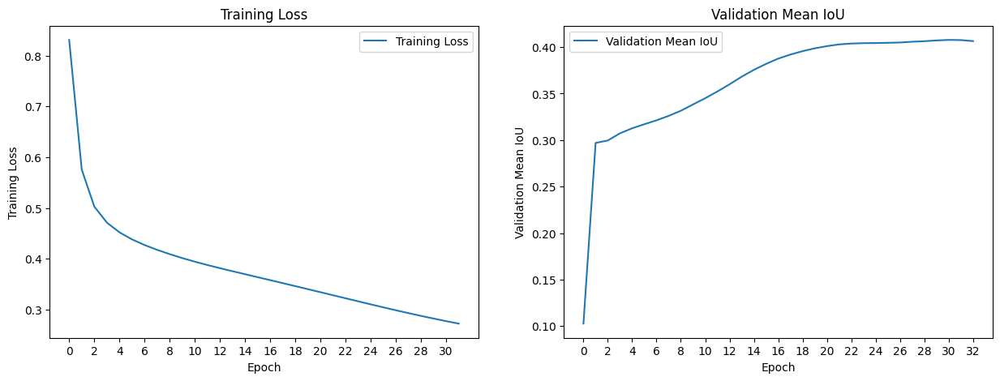

In [ ]:
from torchvision.transforms.functional import to_pil_image

# Load your trained model
model = SegFormer_B0.load_from_checkpoint('lightning_logs/version_0/checkpoints/segformer_b0-epoch=20-miou=0.4042.ckpt')

# Plot Training Curves
loss_logs = torch.load('loss_epochwise.pt')
miou_logs = torch.load('miou_epochwise.pt')

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(loss_logs, label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.xticks(range(0, len(loss_logs), 2))
plt.ylabel('Training Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(miou_logs, label='Validation Mean IoU')
plt.title('Validation Mean IoU')
plt.xlabel('Epoch')
plt.xticks(range(0, len(miou_logs), 2))
plt.ylabel('Validation Mean IoU')
plt.legend()

plt.show()

<ipython-input-20-fb8002e36334>:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  class_colors = plt.cm.get_cmap('viridis', predicted_mask.shape[0]-1)  # Get a colormap with distinct colors


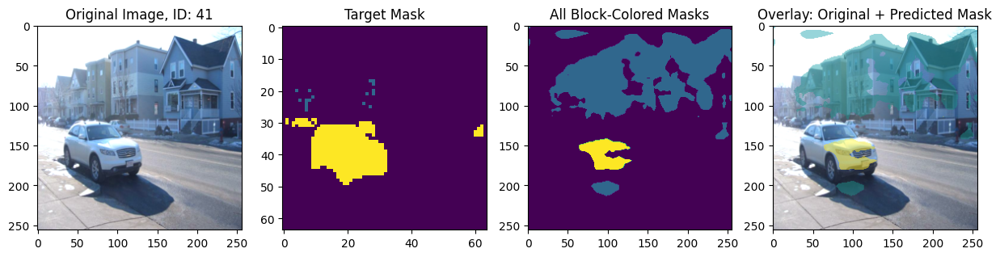

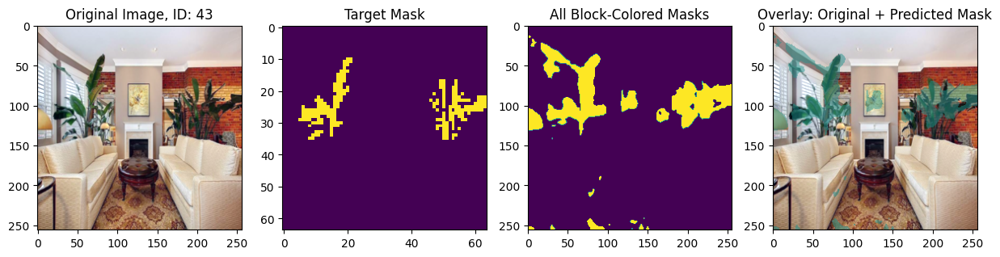

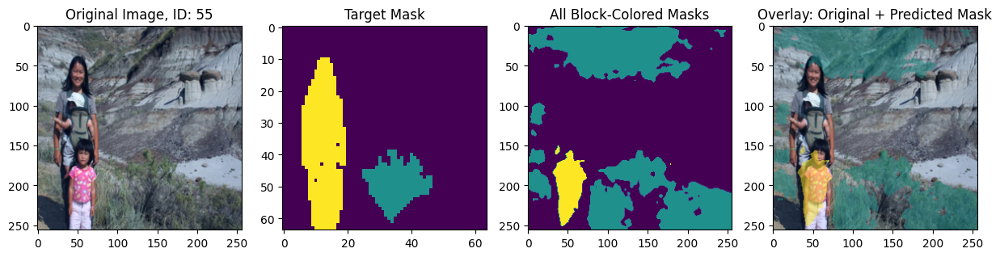

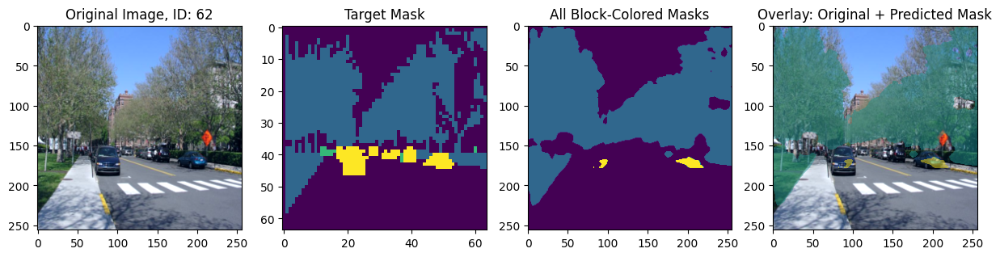

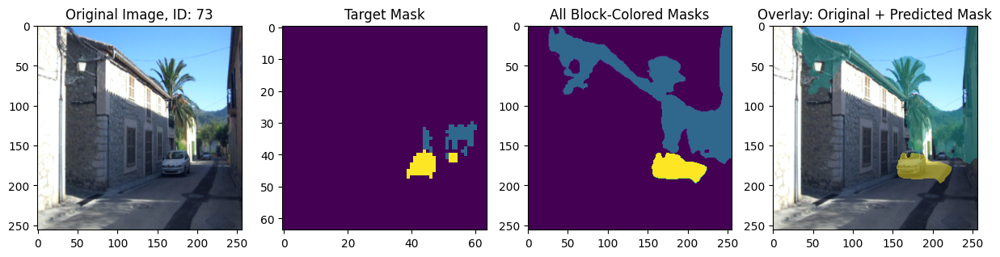

...

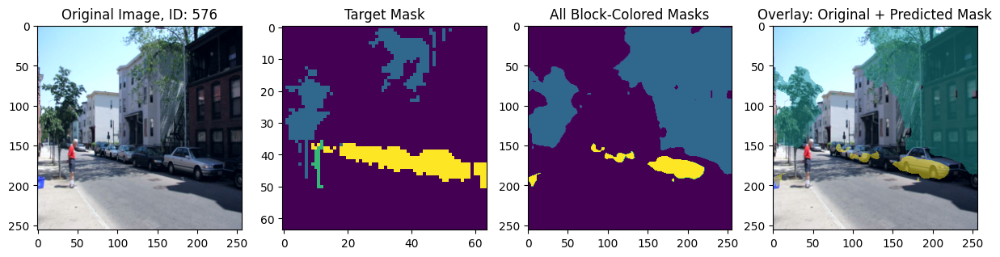

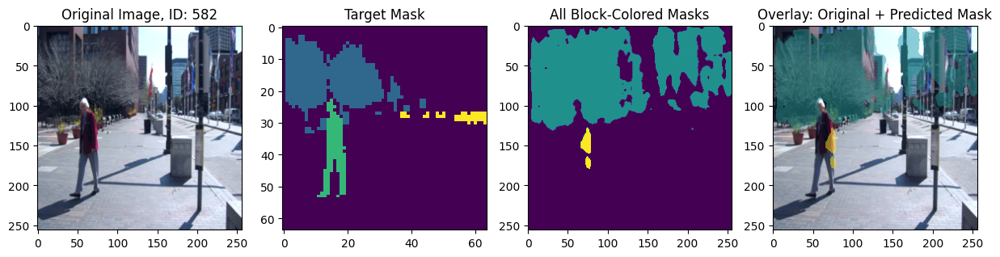

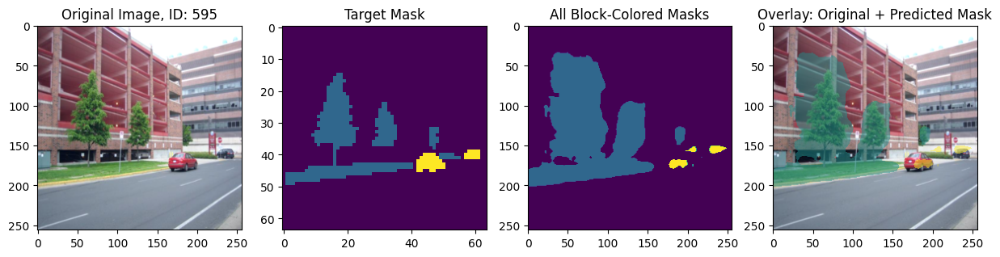

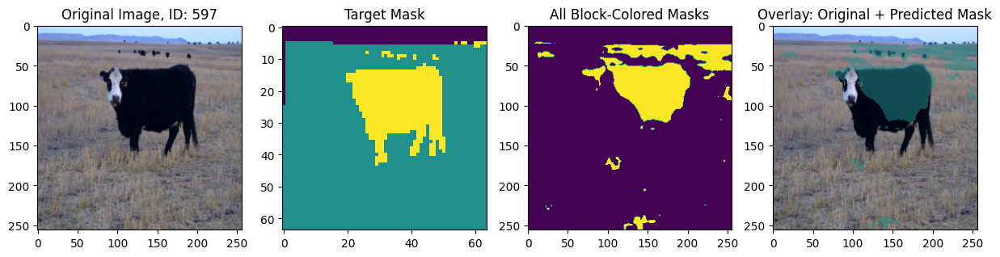

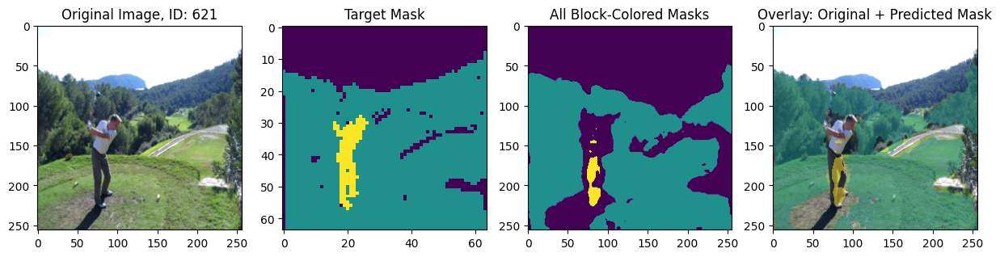

In [ ]:
# List of image IDs to display
selected_ids = [41, 43, 55, 62, 73, 88, 91, 92, 125, 131, 132, 135, 136, 162, 179, 184, 193, 200, 212, 229, 249, 252, 266, 295, 305, 318, 329, 339, 346, 350,
                375, 377, 379, 383, 388, 391, 393, 396, 406, 408, 426, 429, 451, 475, 482, 486, 494, 507, 510, 511, 514, 574, 576, 582, 595, 597, 621, 719,
                738, 744, 768, 777, 789, 790]

# Qualitative Results on Validation Set
val_loader = DataLoader(val_dataset, batch_size=1, num_workers=1)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

with torch.no_grad():
    for i, (image, target) in enumerate(val_loader):

        # Check if the current image ID is in the selected list
        if i in selected_ids:
            image = image.to(device)

            prediction = model(image)

            # Upsample predicted mask to the original image size
            predicted_mask = torch.nn.functional.interpolate(
                prediction,
                size=(256, 256),
                mode='bilinear',
                align_corners=False
            ).squeeze(0).cpu().detach().numpy()

            # Create a single image with all masks in different colors
            plt.figure(figsize=(15, 4))

            # Plot Original Image
            plt.subplot(1, 4, 1)
            plt.imshow(np.clip(image.detach().cpu()[0].permute(1, 2, 0) / 4 + 0.5, 0, 1))
            plt.title(f'Original Image, ID: {i}')

            # # Plot Target Mask
            plt.subplot(1, 4, 2)
            plt.imshow(target.detach().cpu().numpy().squeeze(0), cmap='viridis')
            plt.title('Target Mask')

            # Plot all Block-Colored Masks
            plt.subplot(1, 4, 3)
            block_color_mask = np.zeros_like(predicted_mask)
            class_colors = plt.cm.get_cmap('viridis', predicted_mask.shape[0]-1)  # Get a colormap with distinct colors
            for class_index in range(1, predicted_mask.shape[0]):
                block_color_mask[class_index, :, :] = predicted_mask[class_index, :, :]
            plt.imshow(np.argmax(block_color_mask, axis=0), cmap='viridis')
            plt.title('All Block-Colored Masks')

            # Create a subplot for the overlay of the original image and predicted mask
            plt.subplot(1, 4, 4)
            overlay = image.detach().cpu()[0].permute(1, 2, 0).numpy() / 4 + 0.5
            # Overlay with predicted mask using alpha blending, excluding the background
            for class_index in range(1, predicted_mask.shape[0]):
                overlay = np.where(block_color_mask[class_index, :, :, None] > 0,
                        overlay * 0.5 + 0.5 * np.array(class_colors(class_index)[:3]),  # Use consistent color for each class
                        overlay)

            plt.imshow(np.clip(overlay, 0, 1))
            plt.title('Overlay: Original + Predicted Mask')

            # Display the images
            plt.show()

## Discussion
**1. Why do we overlap and merge patches when reducing dimensions instead of e.g. max pool?**

- The paper & github code conveys that the Segformer employs convolutional layers (to overlap & merge) for downsampling in its semantic segmentation model, with the objective of preserving spatial information effectively.
- In contrast to max pooling, convolutional layers come with learnable parameters, enabling the model to dynamically adapt and learn to retain essential spatial details during the downsampling process.
- This adaptability significantly improves the model's capability to capture and represent intricate spatial patterns, providing advantages over fixed operations such as max pooling, which may inadvertently discard valuable information.


**2. How does efficient self-attention affect the performance of the model?**

- In the case of SegFormer and other similar models, a key strategy to address this issue is reducing the feature size, which refers to the dimensionality of the input tokens.
- By reducing the feature size, the attention mechanism's complexity is effectively reduced to O(N^2/R), where R is the reduction factor.
- I believe that this reduction factor determines how much the dimensionality is lowered, and hence it plays a crucial role in mitigating the quadratic complexity problem.
- Ref: https://papers.nips.cc/paper/2017/file/3f5ee243547dee91fbd053c1c4a845aa-Paper.pdf
- Ref: https://stackoverflow.com/questions/65703260/computational-complexity-of-self-attention-in-the-transformer-model

**3. Why do we only have one activation function in MixFFN?**

- As per my understanding, the second MLP layer primarily focuses on dimensionality reduction for the vector. The decision to omit an extra activation layer in this stage is driven by the goal of maintaining a smooth information flow into the subsequent transformer block.

- The prior use of the GELU activation function adequately introduces non-linearity, and adding another activation layer in the second MLP could potentially disrupt information propagation. Therefore, excluding an additional activation layer in the second MLP optimizes the overall information processing dynamics of the MixFFN architecture.

- Ref: https://stackoverflow.com/questions/63125782/why-shouldnt-we-use-multiple-activation-functions-in-the-same-layer#:~:text=Each%20activation%20function%20have%20its,be%20predictability%20of%20their%20effect.


**4. If we removed padding='same' in MixFFN, would the performance of our model be affected? Why or why not? Suppose that there are no dimensional issues caused by this.**

- By removing the 'padding='same'' parameter from the convolutional layer in the MixFFN model, one essentially eliminates the additional border, or "anchor," that padding typically provides. This absence of padding can have implications for the model's capacity to establish an absolute position reference, affecting the spatial representation of features. Without the protective border, the convolutional layer may encounter difficulties in precisely determining the positioning of features within the input data.

- This modification goes beyond mere computational adjustments; it has the potential to adversely impact segmentation quality, particularly near image edges. The spatial relationships and contextual information in the vicinity of the borders might not be adequately captured, resulting in a decline in the model's ability to accurately segment objects or features, especially those positioned at the peripheries of the input image.

- Therefore, the decision to omit padding='same' introduces a trade-off, sacrificing the spatial robustness typically provided by padding for potentially reduced performance, especially in tasks where precise localization and segmentation accuracy are of utmost importance.

- Ref: https://blog.paperspace.com/padding-in-convolutional-neural-networks/

- Ref: https://analyticsindiamag.com/guide-to-different-padding-methods-for-cnn-models/

**5. What is the difference between cross-entropy loss and miou? Why do we not use the miou to train?**

- When considering semantic segmentation tasks, the choice between cross-entropy loss and mean Intersection over Union (mIoU) is pivotal, and each bears distinct characteristics relevant to training purposes.

- Mean Intersection over Union faces a significant challenge due to its non-differentiability caused by conditional statements. This non-differentiability introduces complexities in the optimization landscape, creating a rugged terrain marked by local minima. Consequently, the training process becomes more challenging. Moreover, mIoU may struggle to effectively capture positional attributes of errors, hindering the identification of specific pixels that have been inaccurately segmented.

- In contrast, Cross-Entropy loss stands out as a preferable choice for training purposes. Its smooth and differentiable nature contributes to a more favorable optimization landscape, promoting efficient convergence during the training process. This characteristic makes Cross-Entropy adept at handling pixel-wise classification tasks. Precise identification of misclassified pixels is crucial for model improvement, and Cross-Entropy's suitability in this regard further enhances its appeal for training. In summary, the distinction between these two loss functions lies in their inherent characteristics, with Cross-Entropy proving advantageous for optimization and pixel-wise classification tasks in the context of semantic segmentation.

- 1) Ref: https://stackoverflow.com/questions/40475246/why-does-one-not-use-iou-for-training

- 2) Ref: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC10029046/


**6. Why are transformers especially suitable for this architecture? Namely, passing through different feature map stages and using a very small decoder. What problems might arise if we used convolutions instead?**

- From our lectures, I've noticed that CNNs inherently have a limited receptive field, making it challenging to capture comprehensive information, especially for objects beyond this field. For instance, accurately delineating the intricate details of large architectural structures becomes difficult using a CNN with a restricted receptive field.

- Transformers, on the other hand, excel in processing sequential data and capturing long-range dependencies. When transitioning from CNNs to a more transformer-centric architecture, the model transforms into a standard Encoder-Decoder with fewer convolutional layers and a lightweight decoder. However, this downsized configuration is insufficient for effective segmentation, especially compared to more advanced models like SOLO. Increasing the CNN's depth to address this issue may lead to vanishing gradient problems. Vision Transformers stand out for their ability to process the entire image, providing a more extensive contextual understanding. While advantageous for capturing global relationships, it requires a larger training dataset due to increased complexity in learning global attentions. This highlights the trade-offs in choosing the most suitable architecture for a given task.


**7. Do you think that adding an FPN makes sense for this architecture? Justify your answer.**

- As discussed in the lecture, FPNs are effective in incorporating contextual information by fusing features from different layers with varying receptive fields. This can enhance the model's understanding of the overall scene and improve segmentation accuracy.

- In SegFormer, we also have mechanisms to perform hierarchical feature extraction, which aids in capturing multiscale features effectively.

- FPN would do similar function. In my opinion, it is worthwhile to perform an ablation study based on the above two points and determine which one performs better.

**8. Your achieved performance is likely not very high, considering the simplicity of the data set. This assignment makes several simplications to the training process that contribute to this. Choose two such simplifications and explain why they degrade the achieved performance.**

- After I saw the youtube video & explanation, and the results mentioned in the paper. I was expecting to have some super-amazing results. However, that was not the case - I did get decent results. But not really good!

- From the results section, we can notice that I've achieved roughly same mIOU (for the SegFormer B0). Simultaneously, we should remember that this model is one of the lightest vision transfomer segmentation model out there. If we implement B1, B2 and onwards - I'm sure we can achieve better results.

- After reading the paper, I felt that the assignment was a simplified version of SegFormer B0. Firstly, the authors used an expansive and balanced dataset. Secondly, in the implementation section, they've mentioned using a learning rate scheduler (POLY LR). Additionally, the data that I used, after visually inspecting it, I sensed that trees occur more number of times.

- They leveraged the above point to train for 160K iterations, which is a lot more than we have trained.